In [1]:
! pip install anndata==0.12.0 pydeseq2==0.5.2 squidpy==1.6.5 spatialdata[extra]==0.4.0 geosketch==1.3 harmonypy==0.0.10 igraph==0.11.8 --quiet

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.6/168.6 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.3/161.3 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.6/183.6 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 41.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 4

In [2]:
! pip install datashader --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 108.9 MB/s eta 0:00:0000:0100:01


In [3]:
# mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [89]:
import spatialdata as spd
import spatialdata_plot as splt
import spatialdata_io as so
import geosketch as sketch
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import h5py

import json
import scipy.io
from scipy.ndimage import affine_transform
import scipy.sparse as sp
import gc
import os
import geopandas as gpd
from spatialdata.models import Image2DModel, TableModel, ShapesModel
import matplotlib.pyplot as plt

from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from PIL import Image
from spatialdata.transformations import Identity, Scale
from shapely.geometry import Polygon
import cv2
from skimage.measure import regionprops, find_contours

## save mtx and geojson from segmentation pipeline

In [62]:
# load existing h5ad data
ab01_adata = ad.read_h5ad('/content/drive/MyDrive/mansfield-lab/visium/AB01_filtered.h5ad')

# output paths
count_mtx_path = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01/segmentation/filtered_feature_bc_matrix/'
geojson_path = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01/segmentation/AB01_filtered_segmentation.geojson'

In [69]:
ab01_adata

AnnData object with n_obs × n_vars = 111497 × 19033
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'
    layers: 'raw_counts'

In [ ]:
# count matrix (10x mtx format)
os.makedirs(count_mtx_path, exist_ok=True)

# genes x cells
scipy.io.mmwrite(count_mtx_path + 'matrix.mtx', ab01_adata.X.T)

pd.Series(ab01_adata.obs_names).to_csv(
    count_mtx_path + 'barcodes.tsv.gz', index=False, header=False, compression='gzip'
)

features = pd.DataFrame({
    'gene_id': ab01_adata.var['gene_ids'],
    'gene_name': ab01_adata.var_names,
    'feature_type': ab01_adata.var['feature_types']
})

features.to_csv(count_mtx_path + 'features.tsv.gz', index=False, header=False,
                sep='\t', compression='gzip')

print('Done')

In [64]:
# compute offset from adata (AB01 only)
x_offset = ab01_adata.obsm['spatial'][:, 0].min() - ab01_adata.obsm['spatial_cropped_150_buffer'][:, 0].min()
y_offset = ab01_adata.obsm['spatial'][:, 1].min() - ab01_adata.obsm['spatial_cropped_150_buffer'][:, 1].min()
print(f"x_offset: {x_offset:.4f}, y_offset: {y_offset:.4f}")

x_offset: 961.0000, y_offset: 0.0000


In [65]:
# geojson export
def export_polygon_geojson(adata, npz_path, geojson_path, offset=(0, 0)):
    """
    reconstructs cell polygon boundaries from the bin2cell label npz and exports as geojson.

    args:
        - adata: cell-level AnnData with obs['object_id'] matching label ids in npz
        - npz_path: path to the he.npz label file from bin2cell
        - geojson_path: output path for the geojson file
    """
    # reconstruct dense label array from sparse npz
    npz = np.load(npz_path, allow_pickle=True)
    labels_sparse = sp.csr_matrix(
        (npz['data'], npz['indices'], npz['indptr']),
        shape=tuple(npz['shape'])
    )
    labels = np.array(labels_sparse.todense(), dtype=np.int32)
    print(f"labels shape: {labels.shape}, unique labels: {np.unique(labels).shape[0]}")

    # single pass over label image to extract bounding box + contour per label
    print("extracting contours via regionprops (single pass)...")
    props = regionprops(labels)

    label_to_contour = {}
    for prop in props:
        label_id = prop.label
        minr, minc, maxr, maxc = prop.bbox
        # crop to bounding box and pad so edge contours are closed
        mask = np.pad(labels[minr:maxr, minc:maxc] == label_id, 1).astype(np.float32)
        contours = find_contours(mask, level=0.5)
        if not contours:
            continue
        contour = max(contours, key=len)
        # undo padding, apply bbox offset, swap (row, col) -> (x, y)
        contour = contour - 1
        contour[:, 0] += minr
        contour[:, 1] += minc
        label_to_contour[label_id] = contour[:, [1, 0]]

    print(f"contours extracted: {len(label_to_contour)}")

    # build lookup: obs_name -> label integer
    obsname_to_label = dict(zip(adata.obs_names, adata.obs['object_id'].astype(int)))

    features_list = []
    skipped = 0

    for obs_name in adata.obs_names:
        label_id = obsname_to_label.get(obs_name)
        contour = label_to_contour.get(label_id)

        if contour is None or len(contour) < 4:
            skipped += 1
            continue

        coords = contour.tolist()
        coords.append(coords[0])  # close the ring

        i = adata.obs_names.get_loc(obs_name)
        features_list.append({
            "type": "Feature",
            "geometry": {
                "type": "Polygon",
                "coordinates": [coords]
            },
            "properties": {
                "cell_id": obs_name,
                "bin_count": int(adata.obs["bin_count"].iloc[i]),
                "label_source": str(adata.obs["labels_joint_source"].iloc[i])
            }
        })

    geojson = {"type": "FeatureCollection", "features": features_list}
    with open(geojson_path, "w") as f:
        json.dump(geojson, f)

    print(f"saved {len(features_list)} polygon features ({skipped} skipped) to: {geojson_path}")

In [ ]:
# AB01
export_polygon_geojson(adata=ab01_adata,
                       npz_path='/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01_bin2cell/new/AB01_he.npz',
                       geojson_path='/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01/segmentation/AB01_filtered_segmentation.geojson',
                       offset=(x_offset, y_offset))

labels shape: (12227, 13683), unique labels: 111593
extracting contours via regionprops (single pass)...
contours extracted: 111592
saved 111258 polygon features (239 skipped) to: /content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01/segmentation/AB01_filtered_segmentation.geojson


In [ ]:
# load existing h5ad data
ab02_adata = ad.read_h5ad('/content/drive/MyDrive/mansfield-lab/visium/AB02_filtered.h5ad')

# output paths
count_mtx_path = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB02/segmentation/filtered_feature_bc_matrix/'
geojson_path = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB02/segmentation/AB02_filtered_segmentation.geojson'

In [ ]:
ab02_adata

AnnData object with n_obs × n_vars = 68008 × 19031
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'
    layers: 'raw_counts'

In [ ]:
# count matrix (10x mtx format)
os.makedirs(count_mtx_path, exist_ok=True)

# genes x cells
scipy.io.mmwrite(count_mtx_path + 'matrix.mtx', ab02_adata.X.T)

pd.Series(ab02_adata.obs_names).to_csv(
    count_mtx_path + 'barcodes.tsv.gz', index=False, header=False, compression='gzip'
)

features = pd.DataFrame({
    'gene_id': ab02_adata.var['gene_ids'],
    'gene_name': ab02_adata.var_names,
    'feature_type': ab02_adata.var['feature_types']
})

features.to_csv(count_mtx_path + 'features.tsv.gz', index=False, header=False,
                sep='\t', compression='gzip')

print('Done')

In [ ]:
# AB02
export_polygon_geojson(adata=ab02_adata,
                       npz_path='/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB02_bin2cell/new/AB02_he.npz',
                       geojson_path='/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB02/segmentation/AB02_filtered_segmentation.geojson')

In [ ]:
# save mtx as h5 files for both samples
ab01_h5_path = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01/segmentation/filtered_feature_bc_matrix/AB01_filtered_feature_bc_matrix.h5'
ab02_h5_path = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB02/segmentation/filtered_feature_bc_matrix/AB02_filtered_feature_bc_matrix.h5'

ab01_X = sp.csc_matrix(ab01_adata.X.T)
ab02_X = sp.csc_matrix(ab02_adata.X.T)

with h5py.File(ab01_h5_path, "w") as f:
    grp = f.create_group("matrix")
    grp.create_dataset("data",    data=ab01_X.data.astype(np.int32))
    grp.create_dataset("indices", data=ab01_X.indices.astype(np.int32))
    grp.create_dataset("indptr",  data=ab01_X.indptr.astype(np.int32))
    grp.create_dataset("shape",   data=np.array(ab01_X.shape, dtype=np.int32))  # (genes, cells)

    barcodes = ab01_adata.obs_names.astype(str).values
    grp.create_dataset("barcodes", data=barcodes.astype("S"))  # byte strings

    feat = grp.create_group("features")
    feat.create_dataset("id",           data=ab01_adata.var["gene_ids"].values.astype("S"))
    feat.create_dataset("name",         data=ab01_adata.var_names.values.astype("S"))
    feat.create_dataset("feature_type", data=np.array(
        ab01_adata.var["feature_types"].values
        if "feature_types" in ab01_adata.var.columns
        else ["Gene Expression"] * ab01_adata.n_vars,
        dtype="S"
    ))

print(f"AB01 h5 saved to: {ab01_h5_path}")

In [ ]:
with h5py.File(ab02_h5_path, "w") as f:
    grp = f.create_group("matrix")
    grp.create_dataset("data",    data=ab02_X.data.astype(np.int32))
    grp.create_dataset("indices", data=ab02_X.indices.astype(np.int32))
    grp.create_dataset("indptr",  data=ab02_X.indptr.astype(np.int32))
    grp.create_dataset("shape",   data=np.array(ab02_X.shape, dtype=np.int32))  # (genes, cells)

    barcodes = ab02_adata.obs_names.astype(str).values
    grp.create_dataset("barcodes", data=barcodes.astype("S"))  # byte strings

    feat = grp.create_group("features")
    feat.create_dataset("id",           data=ab02_adata.var["gene_ids"].values.astype("S"))
    feat.create_dataset("name",         data=ab02_adata.var_names.values.astype("S"))
    feat.create_dataset("feature_type", data=np.array(
        ab02_adata.var["feature_types"].values
        if "feature_types" in ab02_adata.var.columns
        else ["Gene Expression"] * ab02_adata.n_vars,
        dtype="S"
    ))

print(f"AB02 h5 saved to: {ab02_h5_path}")

## helper functions

In [5]:
def create_zarr(count_matrix_path,
                image_path,
                scale_factors_path,
                geojson_path,
                sample_name
):
    """
    takes raw output files from visium HD and structure in .zarr file

    args:
        - count_matrix_path: path to cell segmentation filtered feature-barcode count mtx file
        - image_path: path to image file
        - scale_factors_path: path to scale factors in JSON file
        - geojson_path: path to the cell segmenation geoJSON file
        - sample_name: a name for the zarr output file
    """
    print(sample_name)

    # define names for SpatialData elements first so they can be reused below
    IMAGE_KEY  = sample_name + '_hires_tissue_image'
    TABLE_KEY  = 'segmentation_counts'
    SHAPES_KEY = sample_name + '_cell_boundaries'

    # load AnnData
    adata = sc.read_10x_h5(count_matrix_path)
    adata.var_names_make_unique()
    adata.obs['sample'] = sample_name
    adata.obs.index = sample_name + "_" + adata.obs.index.astype(str)

    # load and preprocess image data
    image_data = np.array(Image.open(image_path))
    if image_data.ndim == 2:
        image_data = image_data[np.newaxis, :, :]           # (H, W) -> (1, H, W)
    elif image_data.ndim == 3:
        image_data = np.transpose(image_data, (2, 0, 1))    # (H, W, C) -> (C, H, W)

    # load scale factors
    with open(scale_factors_path, 'r') as f:
        scale_data = json.load(f)

    # load GeoJSON data
    with open(geojson_path, 'r') as f:
        geojson_data = json.load(f)

    hires_scale = scale_data['tissue_hires_scalef']

    shapes_transformations = {
        "downscale_to_hires": Scale(np.array([hires_scale, hires_scale]), axes=("x", "y"))
    }
    image_transformations = {
        "downscale_to_hires": Identity()
    }

    # build geojson lookup: adata obs index -> geojson feature
    # cell_id in geojson properties is a string barcode -- match directly after prefixing
    geojson_features_map = {
        f"{sample_name}_{feature['properties']['cell_id']}": feature
        for feature in geojson_data['features']
    }

    # align geometries to adata obs order
    geometries = []
    cell_ids_ordered = []

    for obs_index in adata.obs.index:
        feature = geojson_features_map.get(obs_index)
        if feature:
            coords = np.array(feature['geometry']['coordinates'][0])
            geometries.append(Polygon(coords))
            cell_ids_ordered.append(obs_index)
        else:
            geometries.append(None)
            cell_ids_ordered.append(obs_index)

    # drop cells with no matching geometry
    valid_indices = [i for i, geom in enumerate(geometries) if geom is not None]
    geometries = [geometries[i] for i in valid_indices]
    cell_ids_ordered = [cell_ids_ordered[i] for i in valid_indices]

    # build shapes GeoDataFrame with integer instance_id for spatialdata
    shapes_gdf = gpd.GeoDataFrame({
        'cell_id':     cell_ids_ordered,
        'instance_id': np.arange(len(cell_ids_ordered), dtype=np.int64),
        'geometry':    geometries
    }, index=cell_ids_ordered)

    # filter adata to matched cells and assign spatialdata keys
    adata = adata[shapes_gdf.index].copy()
    adata.obs['instance_id'] = shapes_gdf.loc[adata.obs.index,
'instance_id'].values.astype(int)
    adata.obs['region'] = SHAPES_KEY                    # must match SHAPES_KEY exactly
    adata.obs['region'] = adata.obs['region'].astype('category')

    # set integer index on shapes so spatialdata can match table rows to shapes
    shapes_gdf_spd = shapes_gdf.copy()
    shapes_gdf_spd.index = shapes_gdf_spd['instance_id'].values

    # create SpatialData object
    sdata = spd.SpatialData(
        images={
            IMAGE_KEY: Image2DModel.parse(image_data, transformations=image_transformations)
        },
        shapes={
            SHAPES_KEY: ShapesModel.parse(shapes_gdf_spd,
transformations=shapes_transformations)
        },
        tables={
            TABLE_KEY: TableModel.parse(
                adata,
                region=SHAPES_KEY,
                region_key='region',
                instance_key='instance_id'  # integer column matching shapes index
            )
        }
    )

    sdata.write(sample_name, overwrite=True)
    del sdata
    gc.collect()


In [6]:
def crop0(x,crs,bbox):
    return spd.bounding_box_query(
        x,
        min_coordinate=[bbox['x'][0], bbox['y'][0]],
        max_coordinate=[bbox['x'][1], bbox['y'][1]],
        axes=("x", "y"),
        target_coordinate_system=crs,
    )

## convert to .zarr and SpatialData

In [7]:
ab01 = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB01/'
ab02 = '/content/drive/MyDrive/mansfield-lab/visium/cell_segmentation/AB02/'


samples = {
    'AB01': [
        ab01+'segmentation/filtered_feature_bc_matrix/AB01_filtered_feature_bc_matrix.h5',
        ab01+'square_002um/spatial/tissue_hires_image.png',
        ab01+'square_002um/spatial/scalefactors_json.json',
        ab01+'segmentation/AB01_filtered_segmentation.geojson',
        'AB01'
    ],
    'AB02': [
        ab02+'segmentation/filtered_feature_bc_matrix/AB02_filtered_feature_bc_matrix.h5',
        ab02+'square_002um/spatial/tissue_hires_image.png',
        ab02+'square_002um/spatial/scalefactors_json.json',
        ab02+'segmentation/AB02_filtered_segmentation.geojson',
        'AB02'
    ]
}

print("Saving zarr files")
for key, inputs in samples.items():
    create_zarr(count_matrix_path=inputs[0],
                image_path=inputs[1],
                scale_factors_path=inputs[2],
                geojson_path=inputs[3],
                sample_name=inputs[4])

del samples, inputs, key
gc.collect()

Saving zarr files
AB01
INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
INFO     The Zarr backing store has been changed from None the new file path: AB01                                 
AB02
INFO     no axes information specified in the object, setting `dims` to: ('c', 'y', 'x')                           
INFO     The Zarr backing store has been changed from None the new file path: AB02                                 


0

In [9]:
# load zarr files and create SpatialData object

# Loading the zarr files
visium_hd_zarr_paths = {
    "AB01": "/content/drive/MyDrive/mansfield-lab/visium/AB01_zarr",
    "AB02": "/content/drive/MyDrive/mansfield-lab/visium/AB02_zarr"
}


# Loading samples into a dictionary
sdatas = []
for key, path in visium_hd_zarr_paths.items():
    sdata = spd.read_zarr(path)

    for table in sdata.tables.values():
        table.var_names_make_unique()
        table.obs["sample"] = key

    sdatas.append(sdata)
    del sdata, table
    gc.collect()
# Concatenate
concatenated_sdata = spd.concatenate(sdatas, concatenate_tables=True)

concatenated_sdata.write("concatenated_sdata", overwrite=True)

del concatenated_sdata,sdatas,visium_hd_zarr_paths, key, path
gc.collect()

concatenated_sdata = spd.read_zarr("concatenated_sdata")

print("---------------------------------")
print(concatenated_sdata)

/usr/local/lib/python3.12/dist-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/usr/local/lib/python3.12/dist-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside concatenated_sdata). Please see the documentation of `is_self_contained()` to understand
         the implications of working with SpatialData objects that are not self-contained.                         
INFO     The Zarr backing store has been changed from None the new file path: concatenated_sdata                   


/usr/local/lib/python3.12/dist-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


---------------------------------
SpatialData object, with associated Zarr store: /content/concatenated_sdata
├── Images
│     ├── 'AB01_hires_tissue_image': DataArray[cyx] (3, 3683, 6000)
│     └── 'AB02_hires_tissue_image': DataArray[cyx] (3, 5282, 6000)
├── Shapes
│     ├── 'AB01_cell_boundaries': GeoDataFrame shape: (111258, 3) (2D shapes)
│     └── 'AB02_cell_boundaries': GeoDataFrame shape: (67463, 3) (2D shapes)
└── Tables
      └── 'segmentation_counts': AnnData (178721, 19028)
with coordinate systems:
    ▸ 'downscale_to_hires', with elements:
        AB01_hires_tissue_image (Images), AB02_hires_tissue_image (Images), AB01_cell_boundaries (Shapes), AB02_cell_boundaries (Shapes)


The concatenated `SpatialData` object (`concatenated_sdata`) contains:
* 2 images (the `hires_tissue_image.png` for each sample), each with its corresponding coordinate system.
* 2 shapes, which are `GeoDataFrame` representations of the cell segmentation bins.
* one table that holds the cell segmentation bin gene expression data along with its metadata.

Using AB01 as an example, the `SpatialData` object contains the following Elements:
* **Images**:
  * `AB01_hires_tissue_image`: This is the high-resolution version of the downsampled PNG image, associated with the `downscale_to_hires` coordinate system.
* **Shapes**:
  * `AB01_cell_bounderies`: This represents the spatial information (shape and location) for the cell segmentation bins.
* **Tables**:
  * `segmentation_counts`: This table contains the gene expression data and associated metadata for the cell segmentation bins.

In [10]:
concatenated_sdata

SpatialData object, with associated Zarr store: /content/concatenated_sdata
├── Images
│     ├── 'AB01_hires_tissue_image': DataArray[cyx] (3, 3683, 6000)
│     └── 'AB02_hires_tissue_image': DataArray[cyx] (3, 5282, 6000)
├── Shapes
│     ├── 'AB01_cell_boundaries': GeoDataFrame shape: (111258, 3) (2D shapes)
│     └── 'AB02_cell_boundaries': GeoDataFrame shape: (67463, 3) (2D shapes)
└── Tables
      └── 'segmentation_counts': AnnData (178721, 19028)
with coordinate systems:
    ▸ 'downscale_to_hires', with elements:
        AB01_hires_tissue_image (Images), AB02_hires_tissue_image (Images), AB01_cell_boundaries (Shapes), AB02_cell_boundaries (Shapes)

## quality control and filtering

In [11]:
adata = concatenated_sdata['segmentation_counts']
adata

AnnData object with n_obs × n_vars = 178721 × 19028
    obs: 'sample', 'instance_id', 'region'
    uns: 'spatialdata_attrs'

In [12]:
# mito gene calculation
adata.var['mt'] = adata.var_names.str.startswith(('MT-', 'mt-'))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True, percent_top=None)

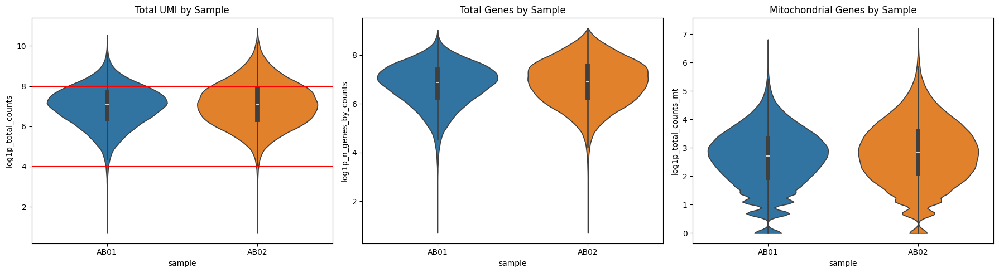

In [15]:
# Visualization for QC
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.violin(adata=adata, keys=["log1p_total_counts"], stripplot=False, inner="box", show=False, groupby="sample", ax=axs[0])
axs[0].set_title("Total UMI by Sample")
axs[0].axhline(y=4, color='r', linestyle='-')
axs[0].axhline(y=8, color='r', linestyle='-')

sc.pl.violin(adata=adata, keys=["log1p_n_genes_by_counts"], groupby="sample", stripplot=False, inner="box", show=False, ax=axs[1])
axs[1].set_title("Total Genes by Sample")

sc.pl.violin(adata=adata, keys=["log1p_total_counts_mt"], groupby="sample", stripplot=False, inner="box", show=False, ax=axs[2])
axs[2].set_title("Mitochondrial Genes by Sample")

plt.tight_layout()
plt.show()
plt.close('all')

In [16]:
# Estimating the cut off
min_counts = np.expm1(4).astype("int")
max_counts = np.expm1(10).astype("int")
print(min_counts, max_counts)

53 22025


In [17]:
# Filtering genes and cells
sc.pp.filter_genes(adata, min_cells=50)
sc.pp.filter_cells(adata, min_counts=min_counts)
sc.pp.filter_cells(adata, max_counts=max_counts)

In [18]:
adata

AnnData object with n_obs × n_vars = 177795 × 18262
    obs: 'sample', 'instance_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'sample_colors'

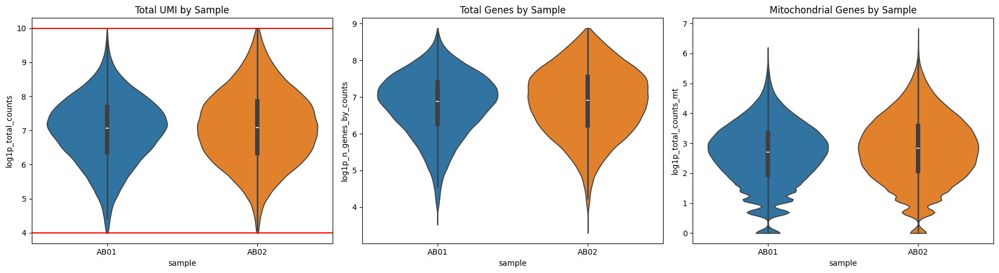

In [23]:
# Visualization for QC
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.violin(adata=adata, keys=["log1p_total_counts"], stripplot=False, inner="box",show=False, groupby="sample", ax=axs[0])
axs[0].axhline(y=4, color='r', linestyle='-')
axs[0].axhline(y=10, color='r', linestyle='-')
axs[0].set_title("Total UMI by Sample")

sc.pl.violin(adata=adata, keys=["log1p_n_genes_by_counts"], groupby="sample", stripplot=False, inner="box",show=False, ax=axs[1])
axs[1].set_title("Total Genes by Sample")

sc.pl.violin(adata=adata, keys=["log1p_total_counts_mt"], groupby="sample", stripplot=False, inner="box",show=False, ax=axs[2])
axs[2].set_title("Mitochondrial Genes by Sample")

plt.tight_layout()
plt.show()
plt.close('all')

# storing filtered counts
adata.layers["filtered_counts"] = adata.X.copy()

In [24]:
adata.X.max()

np.float32(1623.0)

In [25]:
adata

AnnData object with n_obs × n_vars = 177795 × 18262
    obs: 'sample', 'instance_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'sample_colors'
    layers: 'filtered_counts'

## data normalization and dimension reduction

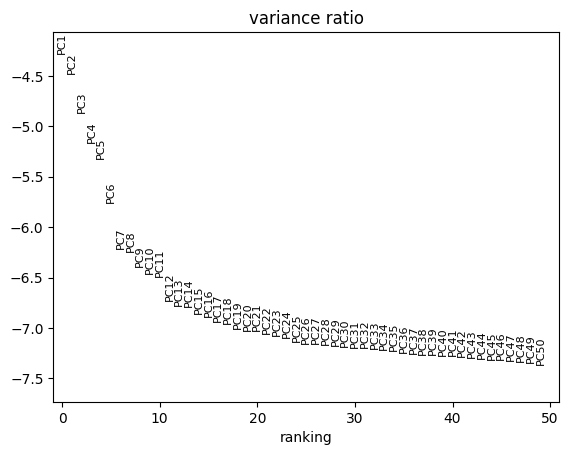

In [26]:
sc.pp.normalize_total(adata, target_sum = None)
sc.pp.log1p(adata)
sc.tl.pca(adata)

# Elbow plot
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [27]:
adata

AnnData object with n_obs × n_vars = 177795 × 18262
    obs: 'sample', 'instance_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'sample_colors', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'filtered_counts'

In [ ]:
# %%time

# RES = [0.4, 0.5, 0.6]
# NEIGHBORS = 30

# MIN_DIST = 0.5
# SPREAD = 2

# sc.pp.neighbors(adata, n_neighbors=NEIGHBORS, use_rep="X_pca")
# for i in RES:
#   sc.tl.leiden(adata, flavor="igraph", key_added=f"leiden_{i}", resolution=i, random_state=0)

# # Set random_state for reproducible UMAP
# sc.tl.umap(adata, min_dist=MIN_DIST, spread=SPREAD, random_state=0)

In [ ]:
# # Plot UMAP
# sc.pl.umap(adata, color=["leiden_0.4"], title="UMAP by Clusters")
# sc.pl.umap(adata, color=["sample"], title="UMAP by Sample")

# # # Cell distribution across clusters
# # sample_names = adata.obs["sample"].unique()
# # plt.imshow(pd.crosstab(adata.obs["sample"], adata.obs["clusters"]), cmap='hot', interpolation='nearest')
# # plt.title("Cell Distribution Across Clusters")
# # plt.xlabel("Cluster")
# # plt.yticks(range(len(sample_names)), sample_names)
# # plt.show()
# # plt.close('all')

# del RES, NEIGHBORS, MIN_DIST, SPREAD
# gc.collect()

In [30]:
adata

AnnData object with n_obs × n_vars = 177795 × 18262
    obs: 'sample', 'instance_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'sample_colors', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'filtered_counts'

2026-03-16 15:25:29,212 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2026-03-16 15:25:53,932 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2026-03-16 15:25:55,120 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2026-03-16 15:27:31,182 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2026-03-16 15:29:04,679 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


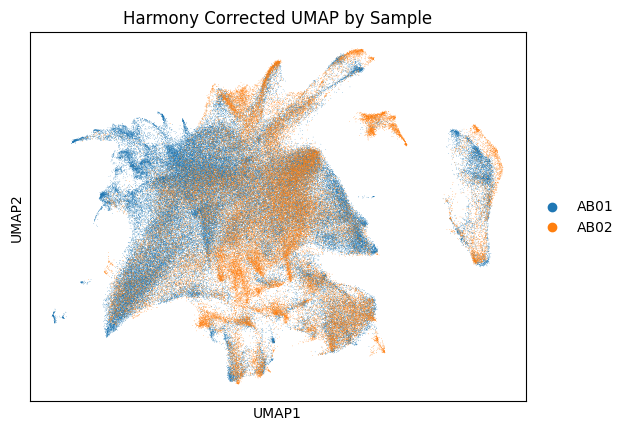

In [32]:
# batch correction

RES = [0.6, 0.7]
NEIGHBORS = 30

MIN_DIST = 0.5
SPREAD = 2

# performing batch correction
adata_harmony = concatenated_sdata["segmentation_counts"].copy()
sce.pp.harmony_integrate(adata_harmony, key="sample", basis="X_pca", max_iter_harmony=20)

# copying the harmony PCA embedding results, new X_pca = X_pca_harmony
adata_harmony.obsm["X_pca_orig"] = adata_harmony.obsm["X_pca"]
adata_harmony.obsm["X_pca"] = adata_harmony.obsm["X_pca_harmony"]

sc.pp.neighbors(adata_harmony, n_neighbors=NEIGHBORS, use_rep="X_pca")
for i in RES:
  sc.tl.leiden(adata_harmony, flavor="igraph", key_added=f"leiden_harmony_{i}", resolution=i, random_state=0)

# Set random_state for reproducible UMAP
sc.tl.umap(adata_harmony, min_dist=MIN_DIST, spread=SPREAD, random_state=0)

# Plot UMAP
sc.pl.umap(adata_harmony, color=["sample"], title="Harmony Corrected UMAP by Sample")

In [33]:
adata_harmony

AnnData object with n_obs × n_vars = 177795 × 18262
    obs: 'sample', 'instance_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden_harmony_0.6', 'leiden_harmony_0.7'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'sample_colors', 'log1p', 'pca', 'neighbors', 'leiden_harmony_0.6', 'leiden_harmony_0.7', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_pca_orig', 'X_umap'
    varm: 'PCs'
    layers: 'filtered_counts'
    obsp: 'distances', 'connectivities'

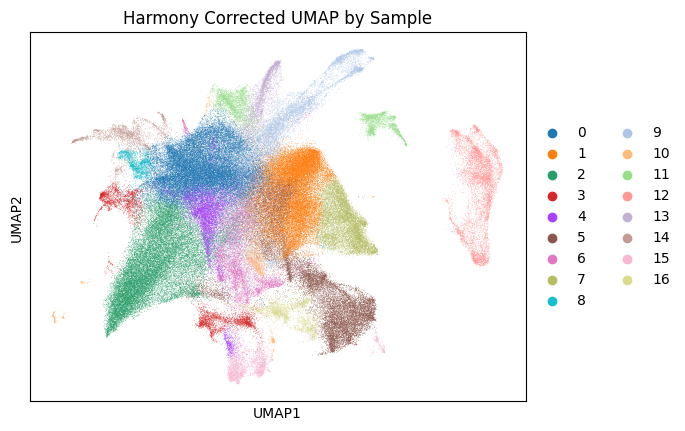

In [34]:
sc.pl.umap(adata_harmony, color=["leiden_harmony_0.7"], title="Harmony Corrected UMAP by Sample")

In [35]:
# use the harmony results in the analysis by overwriting the AnnData table in the SpatialData object
concatenated_sdata["segmentation_counts"] = adata_harmony

/usr/local/lib/python3.12/dist-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


## spatial visualization of clusters

In [ ]:
def crop0(x,crs,bbox):
    """filter all elements of a SpatialData object to only those within a rectangular region"""
    return spd.bounding_box_query(
        x,
        min_coordinate=[bbox['x'][0], bbox['y'][0]],
        max_coordinate=[bbox['x'][1], bbox['y'][1]],
        axes=("x", "y"),
        target_coordinate_system=crs,
    )

Plotting: AB01_hires_tissue_image
INFO     Rasterizing image for faster rendering.                                                                   


/usr/local/lib/python3.12/dist-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `AB01_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/usr/local/lib/python3.12/dist-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Successfully extracted 17 colors from 'leiden_harmony_0.7_colors' in table 'segmentation_counts'.         
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
Plotting: AB02_hires_tissue_image
INFO     Rasterizing image for faster rendering.                                                                   


/usr/local/lib/python3.12/dist-packages/spatialdata/_core/_elements.py:105: UserWarning: Key `AB02_cell_boundaries` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/usr/local/lib/python3.12/dist-packages/spatialdata/_core/_elements.py:125: UserWarning: Key `segmentation_counts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


INFO     Successfully extracted 17 colors from 'leiden_harmony_0.7_colors' in table 'segmentation_counts'.         
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


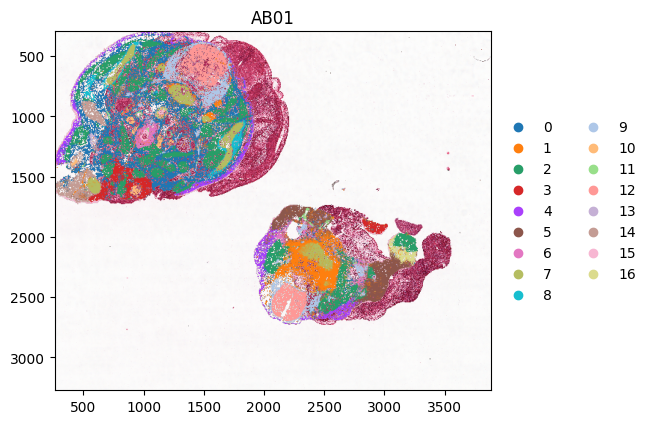

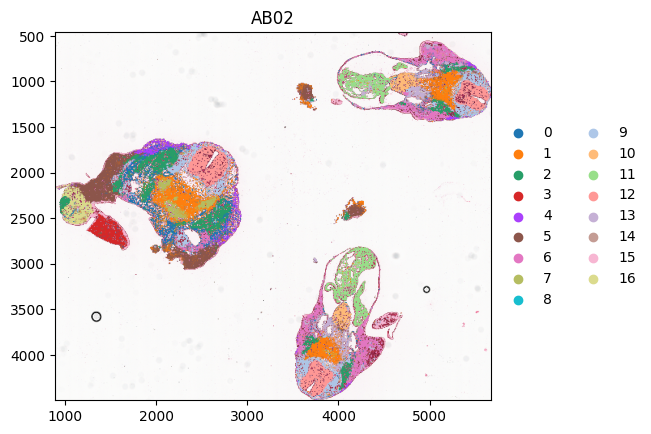

In [ ]:
image_elements = list(concatenated_sdata.images.keys())
shape_elements = list(concatenated_sdata.shapes.keys())

# create a bounding box to crop the data to the capture area
extents = []

for i in range(len(image_elements)):
    extent = spd.get_extent(concatenated_sdata,
                             elements=[shape_elements[i]],
                           coordinate_system='downscale_to_hires')
    extents.append(extent)

# plot
if len(image_elements) != len(shape_elements):
    print("Check the spatial data to make sure that for every image there is a shape")
else:
    for i in range(len(image_elements)):
        print("Plotting: "+ image_elements[i])
        title=image_elements[i].replace("_hires_tissue_image","")
        crop0(concatenated_sdata, crs="downscale_to_hires",
              bbox=extents[i]).pl.render_images(image_elements[i]).pl.render_shapes(shape_elements[i],
              color="leiden_harmony_0.7").pl.show(coordinate_systems="downscale_to_hires", title=title)

## DEGs

In [77]:
adata_harmony

AnnData object with n_obs × n_vars = 177795 × 18262
    obs: 'sample', 'instance_id', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden_harmony_0.6', 'leiden_harmony_0.7'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatialdata_attrs', 'sample_colors', 'log1p', 'pca', 'neighbors', 'leiden_harmony_0.6', 'leiden_harmony_0.7', 'umap', 'leiden_harmony_0.7_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_pca_orig', 'X_umap'
    varm: 'PCs'
    layers: 'filtered_counts'
    obsp: 'distances', 'connectivities'

In [78]:
adata_harmony.X.max()

np.float32(6.094239)

In [79]:
# store raw filtered counts in .raw and normalized counts in .X
adata_raw = adata_harmony.copy()
adata_raw.X = adata_harmony.layers['filtered_counts']
adata_harmony.raw = adata_raw

In [85]:
adata_harmony.layers['norm_log'] = adata_harmony.X.copy()

In [87]:
groups = ['leiden_harmony_0.6', 'leiden_harmony_0.7']

for i in groups:
    key = f'rank_genes_{i}'
    sc.tl.rank_genes_groups(
        adata_harmony, groupby=i, method='wilcoxon', layer='norm_log', 
        use_raw=False, key_added=key
    )

    results = sc.get.rank_genes_groups_df(adata_harmony, group=None, key=key)
    results.to_csv(f'/content/drive/MyDrive/mansfield-lab/visium/deg_{i}.csv', index=False)
    print(f"saved /content/drive/MyDrive/mansfield-lab/visium/deg_{i}.csv")

saved /content/drive/MyDrive/mansfield-lab/visium/deg_leiden_harmony_0.6.csv
saved /content/drive/MyDrive/mansfield-lab/visium/deg_leiden_harmony_0.7.csv


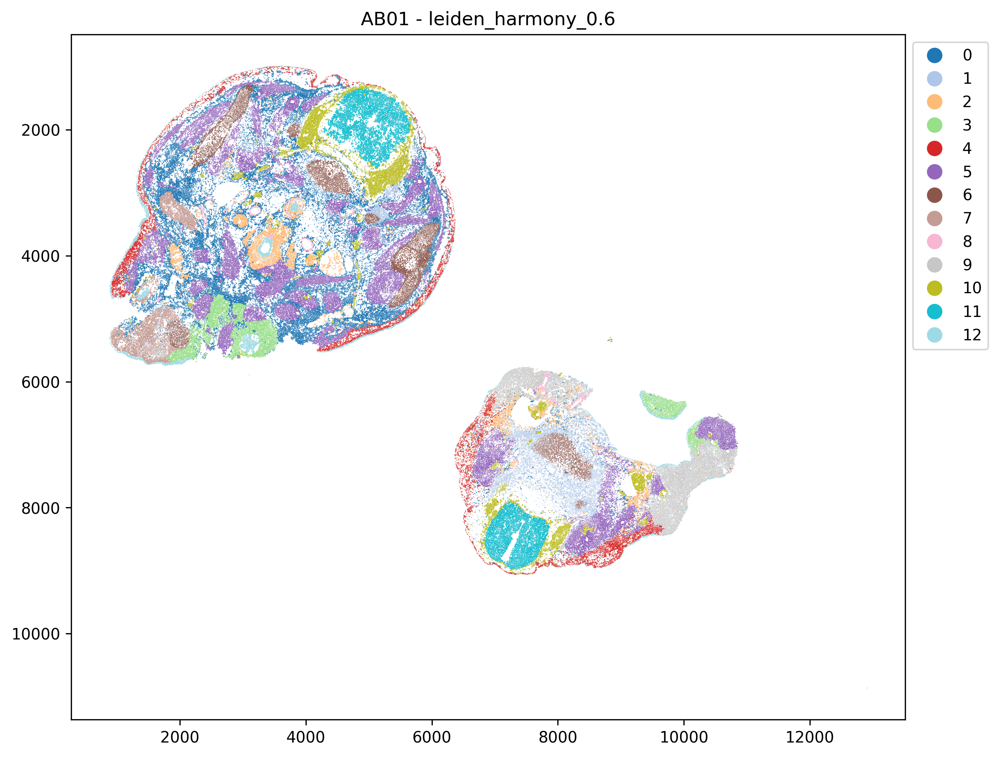

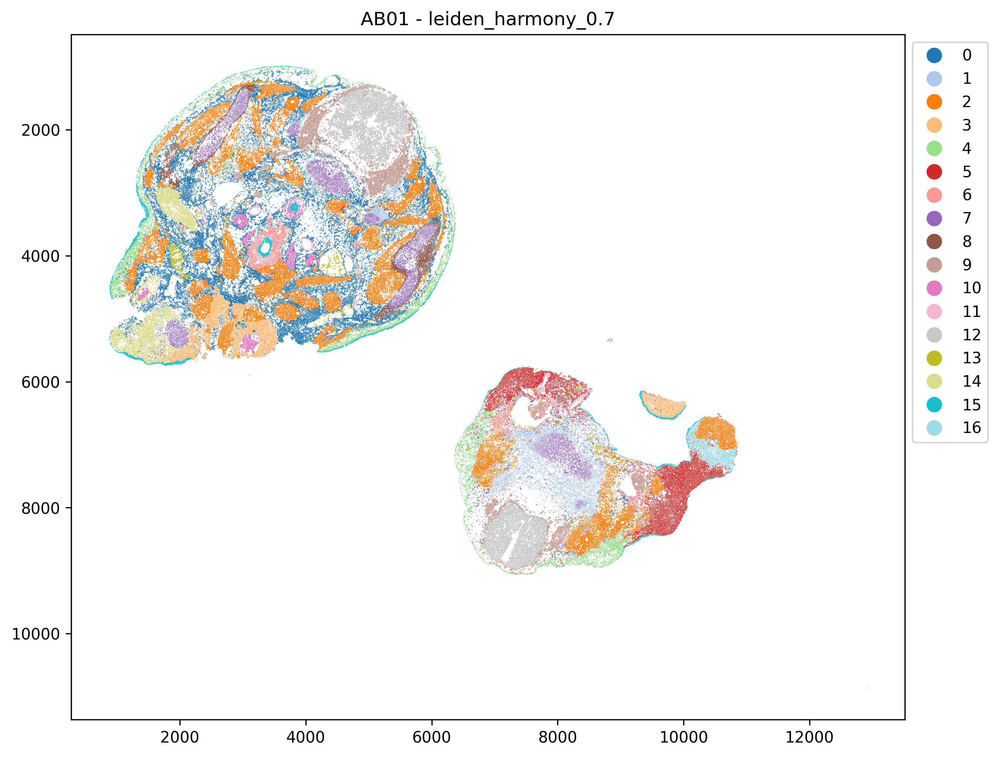

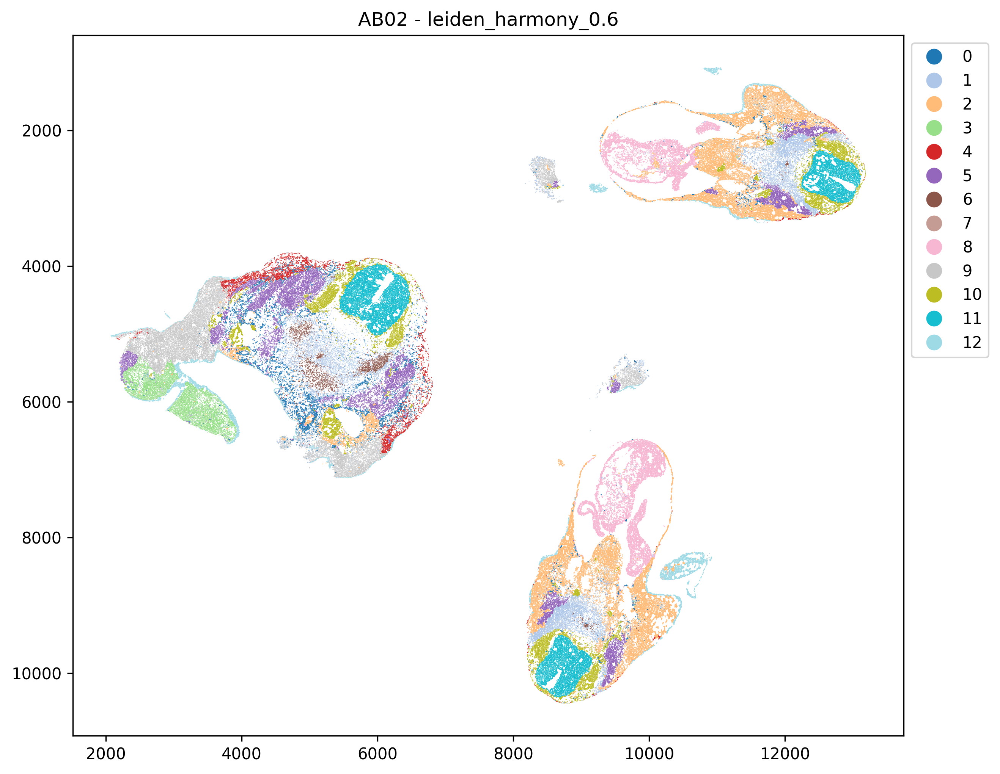

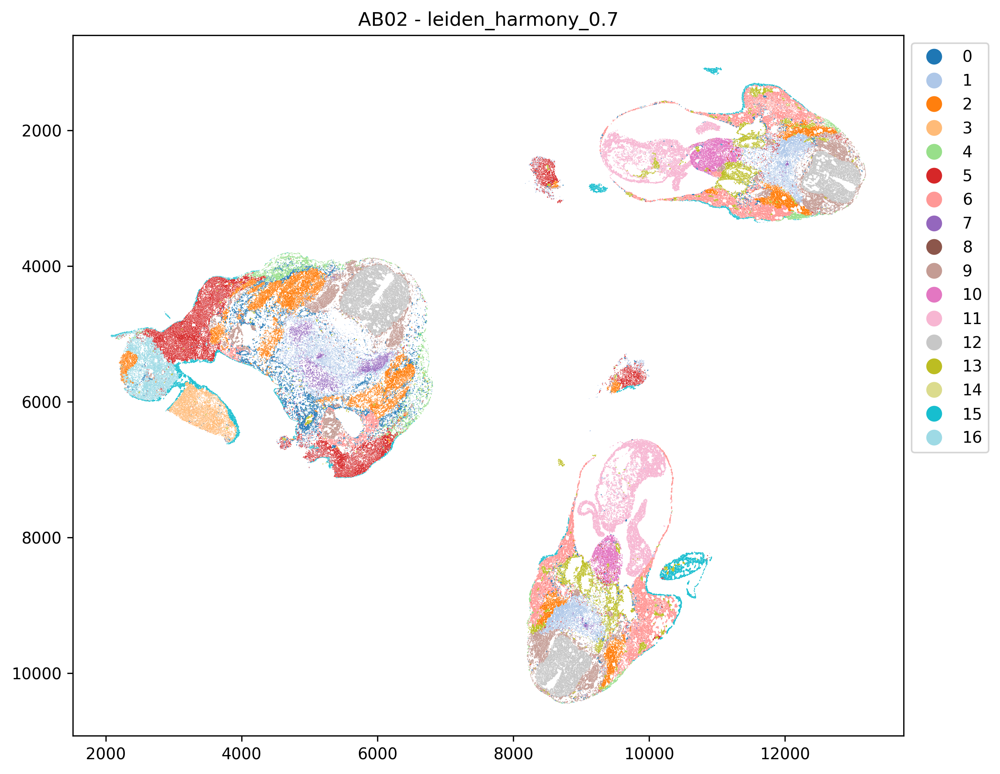

In [91]:
for sample in ['AB01', 'AB02']:
  shapes = concatenated_sdata[f'{sample}_cell_boundaries'].copy()
  mask = adata_harmony.obs['sample'] == sample
  obs_subset = adata_harmony.obs[mask][['instance_id'] + groups]
  shapes = shapes.merge(obs_subset, left_index=True, right_on='instance_id', how='inner')

#   if sample == 'AB01':
#       shapes['geometry'] = shapes['geometry'].apply(
#           lambda geom: affine_transform(geom, [0, 1, 1, 0, 0, 0])
#       )

  for i in groups:
      fig, ax = plt.subplots(figsize=(14, 8), dpi=300)
      shapes.plot(column=i, ax=ax, legend=True, cmap='tab20', linewidth=0,
                  legend_kwds={'loc': 'upper left', 'bbox_to_anchor': (1, 1)})
      ax.set_title(f'{sample} - {i}')
      ax.invert_yaxis()
      plt.savefig(f'{sample}_{i}.png', dpi=300, bbox_inches='tight')
      plt.show()

In [92]:
# save SpatialData object and h5ad
concatenated_sdata.write("/content/drive/MyDrive/mansfield-lab/visium/clustering/concatenated_sdata", overwrite=True) # to reload later, concatenated_sdata = spd.read_zarr("concatenated_sdata")

adata_harmony.write_h5ad('/content/drive/MyDrive/mansfield-lab/visium/clustering/combined_samples.h5ad', compression='gzip')

INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside /content/drive/MyDrive/mansfield-lab/visium/clustering/concatenated_sdata). Please see  
         the documentation of `is_self_contained()` to understand the implications of working with SpatialData     
         objects that are not self-contained.                                                                      
INFO     The Zarr backing store has been changed from concatenated_sdata the new file path:                        
         /content/drive/MyDrive/mansfield-lab/visium/clustering/concatenated_sdata                                 
